In [3]:
import numpy as np 
import pandas as pd 
import os
import matplotlib.pyplot as plt
import seaborn as sns
from ydata_profiling import ProfileReport
import warnings
import os
from sklearn.ensemble import RandomForestRegressor
from sklearn.inspection import permutation_importance, partial_dependence, PartialDependenceDisplay
warnings.filterwarnings('ignore')
%matplotlib inline

**Coffee Quality Institute (CQI) Overview:**

* Nature: Non-profit organization.
* Founded: 1996.
* Location: California, USA.
* Objective: Enhancing the quality and value of coffee globally.
* Activities: Engages in research, training, certification programs, and collaboration with industry stakeholders.

**CQI's Database:**

* Content: Comprehensive information on coffee production, processing, sensory evaluation, genetics, soil types, etc.
*Audience: Coffee professionals and enthusiasts.
**Coffee Sensory Evaluations:**

* Aroma: Scent of the coffee.
* Flavor: Taste characteristics such as sweetness, bitterness, and acidity.
* Aftertaste: Taste lingering post consumption.
* Acidity: Brightness of taste.
* Body: Thickness or feel in the mouth.
* Balance: Harmony of flavor components.
* Uniformity: Consistency of taste across different cups.
* Clean Cup: Absence of off-flavors or defects.
* Sweetness: Caramel, fruity, or floral characteristics.

**Coffee Defects:**

* Category One: Primary defects visible on the beans e.g., Black beans, insect damage.
* Category Two: Subtle defects perceived by taste e.g., Over-fermentation, rancidness.


In [5]:
# Read input data
coffee_data = pd.read_csv('/kaggle/input/coffee-quality-data-cqi/df_arabica_clean.csv')

# Clean column names
coffee_data.columns = coffee_data.columns.str.replace(' ','_')
coffee_data.columns = coffee_data.columns.str.lower()
coffee_data.columns = coffee_data.columns.str.rstrip()
coffee_data.sample(5)

,unnamed:_0,id,country_of_origin,farm_name,lot_number,mill,ico_number,company,altitude,region,...,total_cup_points,moisture_percentage,category_one_defects,quakers,color,category_two_defects,expiration,certification_body,certification_address,certification_contact
55,55,55,Taiwan,森悅高峰咖啡莊園,"The 2022 Pacific Rim Coffee Summit,T039",森悅高峰咖啡莊園,NaN,Taiwan Coffee Laboratory,1400,Nantou,...,84.75,10.4,0,0,green,0,"November 15th, 2023",Taiwan Coffee Laboratory 台灣咖啡研究室,"QAHWAH CO., LTD 4F, No. 225, Sec. 3, Beixin Rd...","Lin, Jen-An Neil 林仁安 - 886-289116612"
28,28,28,Taiwan,他扶芽有機農園,"The 2022 Pacific Rim Coffee Summit,T045",他扶芽有機農園,NaN,Taiwan Coffee Laboratory,1060,Chiayi,...,85.50,10.2,0,0,blue-green,0,"November 15th, 2023",Taiwan Coffee Laboratory 台灣咖啡研究室,"QAHWAH CO., LTD 4F, No. 225, Sec. 3, Beixin Rd...","Lin, Jen-An Neil 林仁安 - 886-289116612"
20,20,20,Guatemala,Finca Vista Hermosa,"The 2022 Pacific Rim Coffee Summit,GT03",El Vergel,NaN,Taiwan Coffee Laboratory,1900,"Guatemala, Fraijanes, Santa Rosa",...,85.75,11.6,0,0,yellowish,0,"November 15th, 2023",Taiwan Coffee Laboratory 台灣咖啡研究室,"QAHWAH CO., LTD 4F, No. 225, Sec. 3, Beixin Rd...","Lin, Jen-An Neil 林仁安 - 886-289116612"
114,114,114,Colombia,La fortaleza,3-0104-00202 Popayán Supremo,Trilladora Pubenza,3-0104-00202,Cafe Colsuaves,1700,Popayán Cauca,...,83.50,12.2,0,0,bluish-green,2,"January 18th, 2024",ASOCIACIÓN COLOMBIANA PARA LA EXCELENCIA DEL CAFE,Calle 60A #3D-32 / Planta Baja / CQ Lab ASECC,Carlos Julian Ruiz - 3212026991
102,102,102,United States (Hawaii),various farms,"The 2022 Pacific Rim Coffee Summit,US02",Aloha Hills Kona Coffee,NaN,Taiwan Coffee Laboratory,400-600,Ka'u,...,83.83,11.8,0,3,green,3,"November 15th, 2023",Taiwan Coffee Laboratory 台灣咖啡研究室,"QAHWAH CO., LTD 4F, No. 225, Sec. 3, Beixin Rd...","Lin, Jen-An Neil 林仁安 - 886-289116612"


# **Data Preprocessing**


In [6]:
# ydata profiling report 
report = ProfileReport(coffee_data, title='Coffee Data Analysis')
report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

**Dataset Overview:**

* Structure: 207 rows x 41 variables.
* Composition: 15 numeric, 26 categorical variables.
* Quality: No duplicates; <2% missing values.

**Content Details:**

* Origin: Data sourced from CQI's website.
* Identification: Columns like lot number and ICO number.
* Location Info: Country, farm, mill, altitude, region.
* Sample Data: Bag weight, count, producer, owner, color.
* Chronology: Harvest year, grading date.
* Processing: Method, completion, expiration, certificate info.
* Quality Metrics: Coffee quality scores, total cup points, moisture%.
* Defects: Categories 1 & 2; Quakers (faulty beans).

**Data Pre-Processing Recommendations:**

* Drop Unneeded: 4 variables with constant values (e.g., Status, Clean Cup); some high-cardinality variables, like IDs.
* Balance: 'Uniformity' is imbalanced.
* Missing Data: 3 variables have missing entries.
* Variance Issues: Category One Defects and Quakers have minimal variance.


**Does 'Total Cup Points' Equal the Sum of Sensory Evaluations?**

Let's conduct a basic validation to determine if the 'Total Cup Points' is derived by adding up the sensory evaluation scores for coffee quality.

In [7]:
# Sanity check to verify if total cup points is the sum of all the coffee quality scores
variables_list = ['aroma','flavor','aftertaste','acidity','body','balance','uniformity','clean_cup','sweetness','overall']
coffee_data['sum_of_variables'] = np.sum(coffee_data[variables_list], axis = 1)

totals_list = ['sum_of_variables','total_cup_points']

sanity_check = coffee_data[variables_list + totals_list]
sanity_check[sanity_check['sum_of_variables'].round(1) != sanity_check['total_cup_points'].round(1)]

,aroma,flavor,aftertaste,acidity,body,balance,uniformity,clean_cup,sweetness,overall,sum_of_variables,total_cup_points
19,8.17,8.00,7.92,7.92,8.17,7.75,10.0,10.0,10.0,7.92,85.85,85.83
55,7.67,7.92,7.92,7.83,7.75,7.83,10.0,10.0,10.0,7.83,84.75,84.75
57,7.83,7.83,7.75,7.92,7.83,7.75,10.0,10.0,10.0,7.83,84.74,84.75
97,7.67,7.75,7.67,7.75,7.67,7.67,10.0,10.0,10.0,7.67,83.85,83.83
107,7.83,7.83,7.67,7.58,7.58,7.58,10.0,10.0,10.0,7.58,83.65,83.67
128,7.92,7.67,7.42,7.50,7.67,7.58,10.0,10.0,10.0,7.50,83.26,83.25
147,7.33,7.58,7.25,7.33,7.75,8.17,10.0,10.0,10.0,7.33,82.74,82.75
165,7.50,7.50,7.42,7.42,7.42,7.67,10.0,10.0,10.0,7.42,82.35,82.33
181,7.25,7.42,7.42,7.50,7.42,7.42,10.0,10.0,10.0,7.42,81.85,81.83
184,7.42,7.50,7.58,7.33,7.33,7.25,10.0,10.0,10.0,7.33,81.74,81.75


# Feature Engineering

By combining current variables, we can unearth more profound insights and enhance model performance. In the subsequent code, we've introduced a variable to represent the coffee's age. Additionally, we've refined the altitude and color columns for better analytical suitability.


In [9]:
# Calculate age of coffee
coffee_data['expiration'] = pd.to_datetime(coffee_data['expiration'])
coffee_data['expiration_year'] = coffee_data['expiration'].dt.year
coffee_data['harvest_year'] = coffee_data['harvest_year'].astype(str).str[:4]
coffee_data['age'] = coffee_data['expiration_year'] - coffee_data['harvest_year'].astype(int)

# Function to replace special characters and calculate mean when a range is specified
def calculate_mean(value):
    value = value.replace('~', '-').replace('A', '-').replace(' ','')
    if '-' in value:
        min_val, max_val = value.split('-')
        return np.mean([float(min_val), float(max_val)])
    else:
        return float(value)

# Apply the calculate_mean function to altitude
coffee_data['altitude'] = coffee_data['altitude'].astype(str).apply(calculate_mean)

# Fix typos in color
coffee_data['color'] = coffee_data['color'].replace('yellow green','yellow-green').replace(' ','').replace('yello-green','yellow-green')

In [10]:
# Dropping unnecessary information
to_drop = ['status','clean_cup','sweetness','defects','farm_name','lot_number','mill','region','producer','grading_date','id','ico_number','owner','certification_contact','certification_address','certification_body','producer','company','unnamed:_0','number_of_bags','bag_weight','in-country_partner','sum_of_variables','expiration','harvest_year','expiration_year']
coffee_data.drop(to_drop,axis = 1,inplace = True)

coffee_data.sample(5)

,country_of_origin,altitude,variety,processing_method,aroma,flavor,aftertaste,acidity,body,balance,uniformity,overall,total_cup_points,moisture_percentage,category_one_defects,quakers,color,category_two_defects,age
98,Guatemala,1400.0,"BOURBON, CATURRA Y CATIMOR",Natural / Dry,7.58,7.83,7.67,7.67,7.67,7.67,10.0,7.75,83.83,10.8,0,0,green,4,2
17,Taiwan,1300.0,Gesha,Natural / Dry,8.00,8.17,8.00,7.92,7.92,7.92,10.0,8.17,86.08,10.3,0,0,yellow-green,0,1
140,Taiwan,275.0,Typica,Pulped natural / honey,7.50,7.67,7.58,7.58,7.50,7.50,10.0,7.58,82.92,8.9,0,0,blue-green,0,3
82,Honduras,1368.0,Catuai,Washed / Wet,7.75,7.75,7.58,7.83,7.75,7.75,10.0,7.75,84.17,10.2,0,0,green,2,2
96,Thailand,1350.0,Catimor,Natural / Dry,7.75,7.67,7.58,7.75,7.75,7.67,10.0,7.75,83.92,11.6,0,0,yellowish,3,1


In [11]:
# report = ProfileReport(coffee_data, title='Processed Coffee Data Analysis')
# report

Histograms are constructed for every numerical attribute, enabling visualization of each variable's distribution, potential outliers, and skewness. Additionally, box plots serve to spotlight the various quantiles of the variable and provide clarity on the magnitude of outliers, if present.


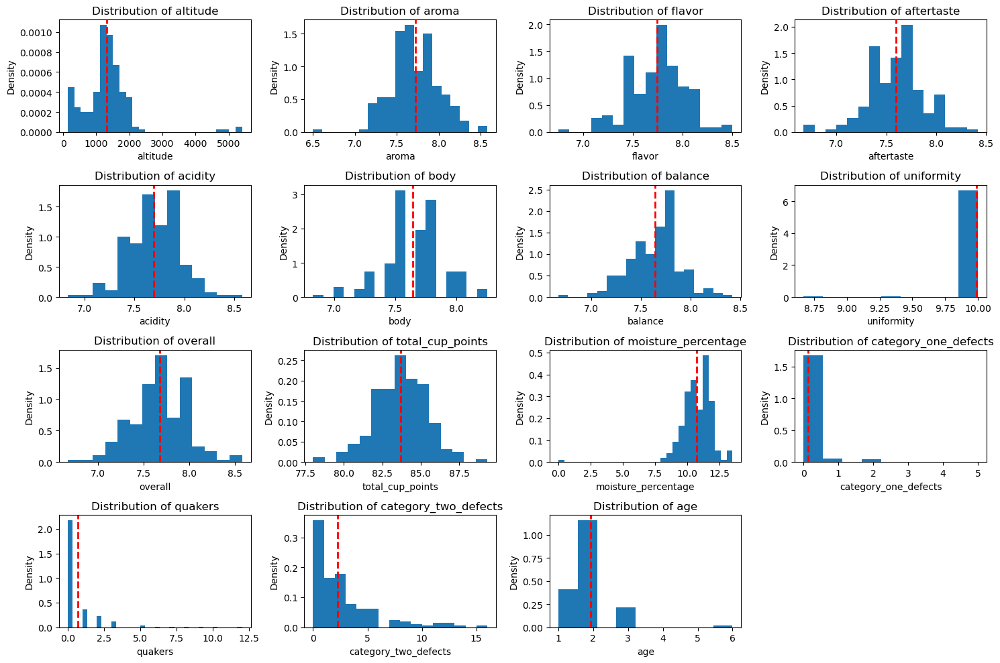

In [12]:
numeric_cols = coffee_data.select_dtypes(['int','float']).columns

# Define the grid dimensions
num_cols = 4
num_rows = (len(numeric_cols) + num_cols - 1) // num_cols

# Create subplots and iterate over numeric columns
fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 10))
axes = axes.flatten()

for i, column in enumerate(numeric_cols):
    ax = axes[i]
    ax.hist(coffee_data[column], bins='auto', density=True)
    ax.axvline(np.mean(coffee_data[column]), color='red', linestyle='dashed', linewidth=2)
    ax.set_title(f"Distribution of {column}")
    ax.set_xlabel(column)
    ax.set_ylabel("Density")

# Hide empty subplots, if any
for j in range(len(numeric_cols), num_rows * num_cols):
    fig.delaxes(axes[j])

# Adjust spacing between subplots
fig.tight_layout()

# Display the plots
plt.show()

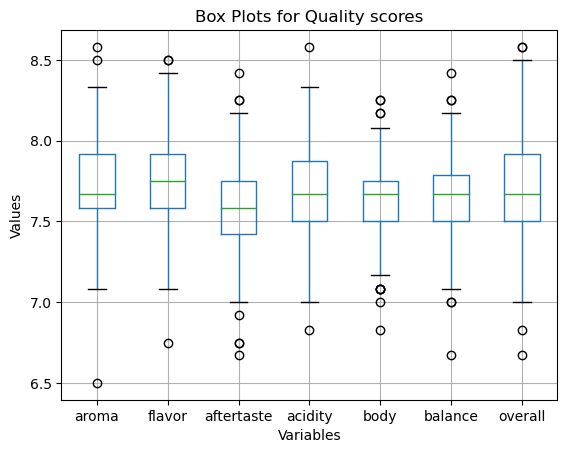

In [13]:
numeric_vars = ['aroma','flavor','aftertaste','acidity','body','balance','overall']

# Plot box plots for selected numeric variables
coffee_data.boxplot(column=numeric_vars)

# Set title and labels
plt.title('Box Plots for Quality scores')
plt.xlabel('Variables')
plt.ylabel('Values')

# Display the plot
plt.show()

**Insights from the Visualizations:**

* The histograms reveal outliers in certain variables like altitude, aroma, flavor, aftertaste, total cup points, moisture percentage, and age.
* We observe skewed distributions in variables like category two defects and quakers.
* The box plots indicate that the aftertaste scores tend to be somewhat lower than other quality metrics.

Moving forward, it's beneficial to delve into the top five subcategories within each categorical variable. Presenting these as a percentage of the total rather than mere counts offers a clearer perspective on their relevance to the entire dataset.



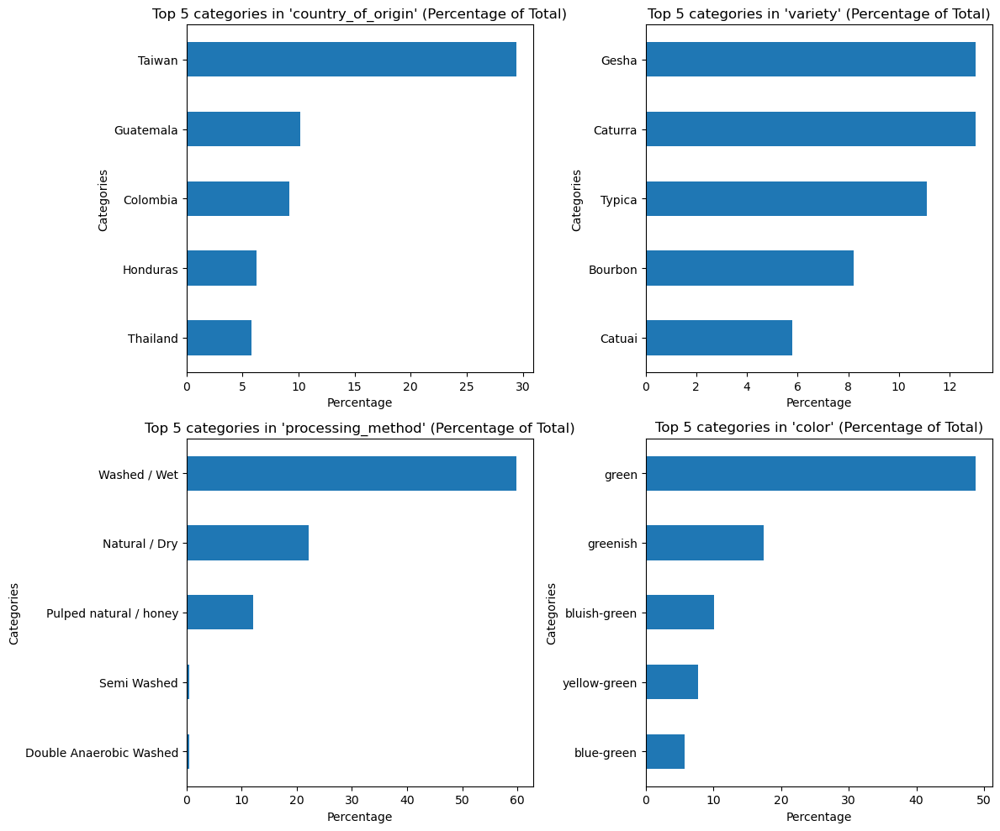

In [14]:
# Calculate percentage of total for each categorical column
percentages = {}
for column in coffee_data.select_dtypes(include='object'):  # Select only categorical columns
    total = len(coffee_data[column])
    percentages[column] = coffee_data[column].value_counts().nlargest(5) / total * 100

# Set the number of columns and rows for subplots
num_columns = 2
num_rows = 2

# Create subplots
fig, axes = plt.subplots(num_rows, num_columns, figsize=(12, 10))

# Flatten the axes array
axes = axes.flatten()

# Plot bar graphs for top 5 categories in each column
for i, (column, percentages) in enumerate(percentages.items()):
    percentages = percentages.sort_values(ascending=True)  # Sort values in ascending order
    
    # Plot in the corresponding subplot
    ax = axes[i]
    percentages.plot(kind='barh', ax=ax)  # Use horizontal bar chart
    ax.set_title(f"Top 5 categories in '{column}' (Percentage of Total)")
    ax.set_xlabel("Percentage")
    ax.set_ylabel("Categories")

# Remove any unused subplots
if len(percentages) < num_columns * num_rows:
    for j in range(len(percentages), num_columns * num_rows):
        fig.delaxes(axes[j])

# Adjust spacing between subplots
fig.tight_layout()

# Display the plot
plt.show()

**Key Takeaways from the Plots:**

* Taiwan accounted for over 30% of the grading.
* Varieties like Gesha and Cattura are prevalent.
* A significant majority, over 60%, of the coffee beans underwent the 'Washed / Wet' processing method.
* The dominant color for the beans is green. Without clarity on whether "green" is synonymous with "greenish," we should consider them distinct.

# **Exploring Correlations**
Delving into correlations among multiple variables can uncover valuable insights. These relationships can be pivotal in addressing specific business inquiries. A heatmap of all numeric variables serves as an excellent starting point to identify noteworthy correlations.



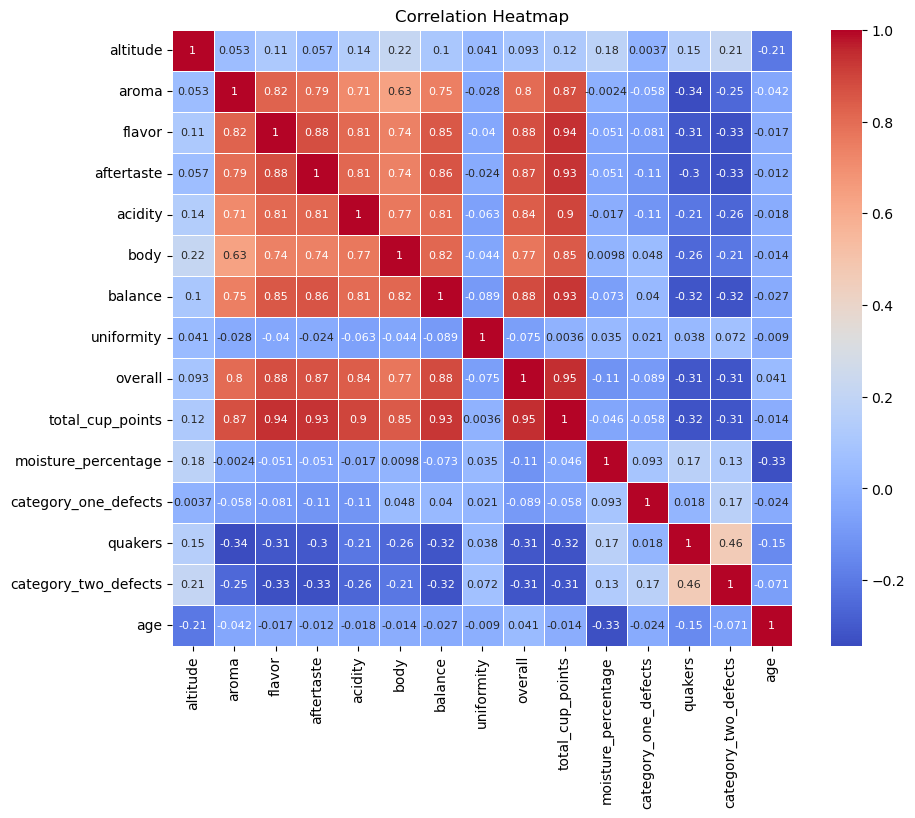

In [15]:
# Calculate correlation matrix
corr_matrix = coffee_data.corr()

# Set up the matplotlib figure and axes
fig, ax = plt.subplots(figsize=(10, 8))

# Create the correlation heatmap using seaborn
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', linewidths=0.5, ax=ax, annot_kws={"fontsize": 8})

# Set plot title
plt.title('Correlation Heatmap')

# Rotate x-axis tick labels for better visibility
plt.xticks(rotation=90)

# Display the plot
plt.show()

**Insights from the Data:**

* Not surprisingly, there's a strong correlation between coffee quality scores and total cup points.
* Quakers and Category two defects share a correlation of 0.46. This is anticipated since quakers represent faulty beans, naturally leading to defects.
* Apart from these, no significant correlations emerge among the numeric variables.

Exploring the relationship between categorical and numeric variables could further illuminate insightful patterns.


In [17]:
def plot_categorical_vs_numeric_with_counts(coffee_data, num_field, cat_field1, cat_field2=None):
    plt.rc('font', size=9)
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8))  # Increase the figure size

    # Bar plot for the average of the numeric field
    data = coffee_data[[cat_field1, num_field]].copy()
    data = data.groupby(cat_field1)[num_field].mean().sort_values(ascending=True)
    ax1.barh(data.index, data.values)
    ax1.set_title(f'Average {num_field} by {cat_field1}')
    ax1.set_xlabel(f'Average {num_field}')
    ax1.set_ylabel(cat_field1)
    ax1.set_yticklabels([label[:15] + '...' if len(label) > 15 else label for label in data.index])  # Truncate category labels if length exceeds 15 characters
    
    # Add text annotations to the bars in the first plot
    for i, value in enumerate(data.values):
       ax1.text(value, i, f'{value:.2f}', color = 'white', ha='right', va='center')
    
    # Bar plot for the count of records
    count_data = coffee_data[cat_field1].value_counts().sort_index()
    count_data = count_data.reindex(data.index)  # Reorder the count data based on the order from the first graph
    ax2.barh(count_data.index, count_data.values, color='orange')
    ax2.set_title(f'Number of Records by {cat_field1}')
    ax2.set_xlabel('Number of Records')
    ax2.set_ylabel(cat_field1)
    ax2.set_yticklabels([label[:15] + '...' if len(label) > 15 else label for label in count_data.index])  # Truncate category labels if length exceeds 15 characters

    plt.tight_layout()
    plt.show()

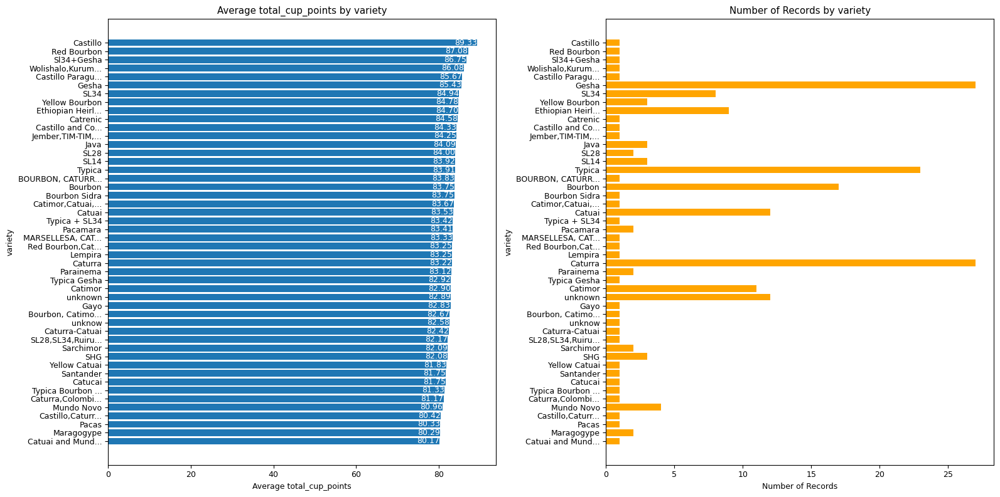

In [18]:
plot_categorical_vs_numeric_with_counts(coffee_data, 'total_cup_points', 'variety')

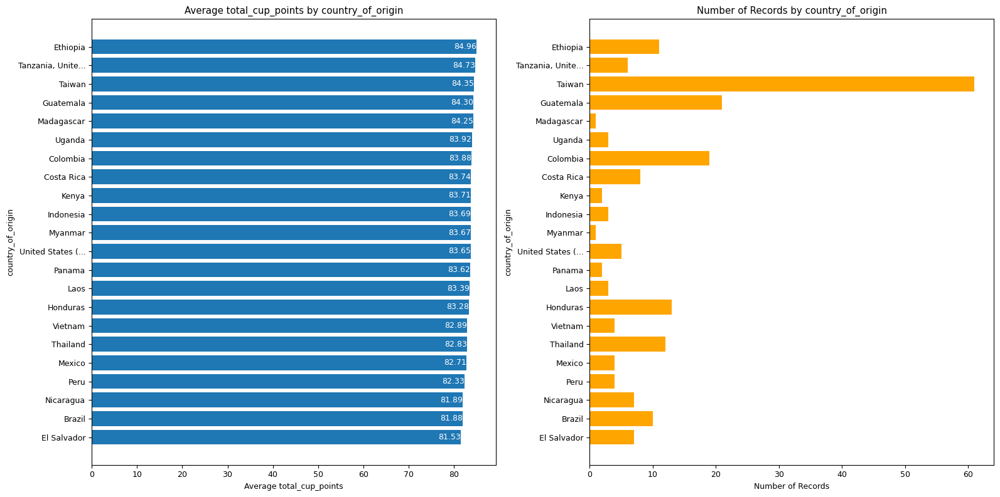

In [19]:
plot_categorical_vs_numeric_with_counts(coffee_data, 'total_cup_points', 'country_of_origin')

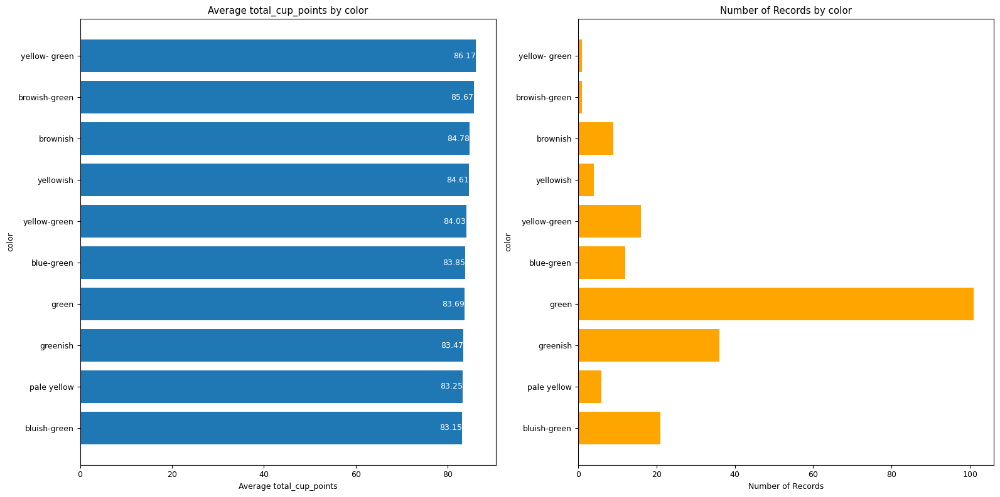

In [20]:
plot_categorical_vs_numeric_with_counts(coffee_data, 'total_cup_points', 'color')

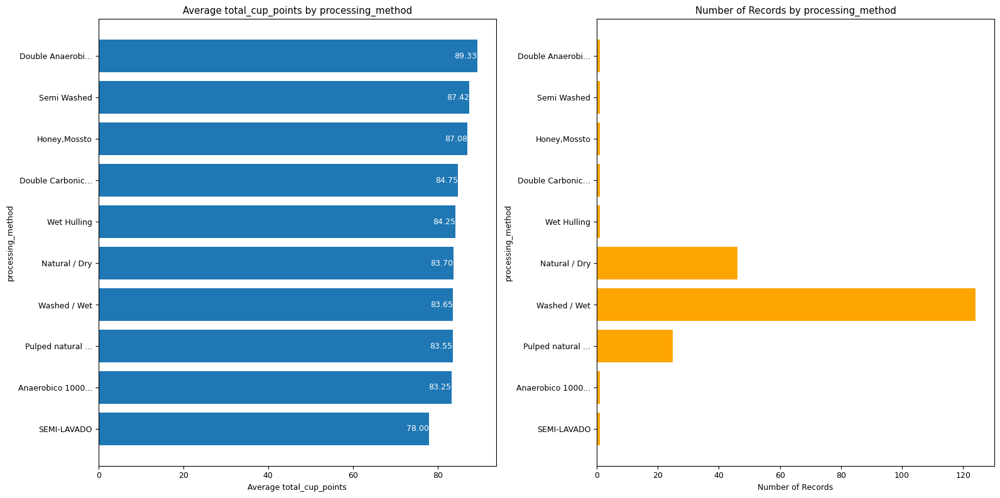

In [21]:
plot_categorical_vs_numeric_with_counts(coffee_data, 'total_cup_points', 'processing_method')

**Insights Gathered:**

* While certain coffee varieties like Gesha and Caturra are predominant in the dataset, they also stand out for their superior total cup points.
* Taiwan, being the leading country of origin, consistently offers coffee with commendable total cup points.
* The 'Washed/Wet' method dominates in processing, yet the 'Double Anaerobic Washed' method yields the highest total cup points. However, this observation requires caution due to the limited sample size for the latter method.


# Modelling

Given that the total cup points appear to be a straightforward aggregation of the coffee quality scores, a conventional machine learning approach might not yield the most insightful results. Nevertheless, there are alternative strategies that can elucidate which factors predominantly influence the total cup points. Here are some methodologies to gauge the significance or influence of input features on the outcome:


In [22]:
coffee_data_for_pred = coffee_data[['aroma','flavor','aftertaste','acidity','body','balance','total_cup_points','moisture_percentage','category_one_defects','quakers','category_two_defects','age','color']]

**1. Gauging Feature Significance via Random Forest Regressor**

Random forest algorithms can generate a feature importance graph that assesses the predictive strength of each input feature. Through this, we can understand the extent to which each variable influences the target outcome, pinpointing the most impactful features.

These importances are derived by measuring the average and standard deviation of impurity reductions across individual trees. For more detailed insights, refer to [scikit-learn's documentation on this topic.](https://scikit-learn.org/stable/auto_examples/ensemble/plot_forest_importances.html)

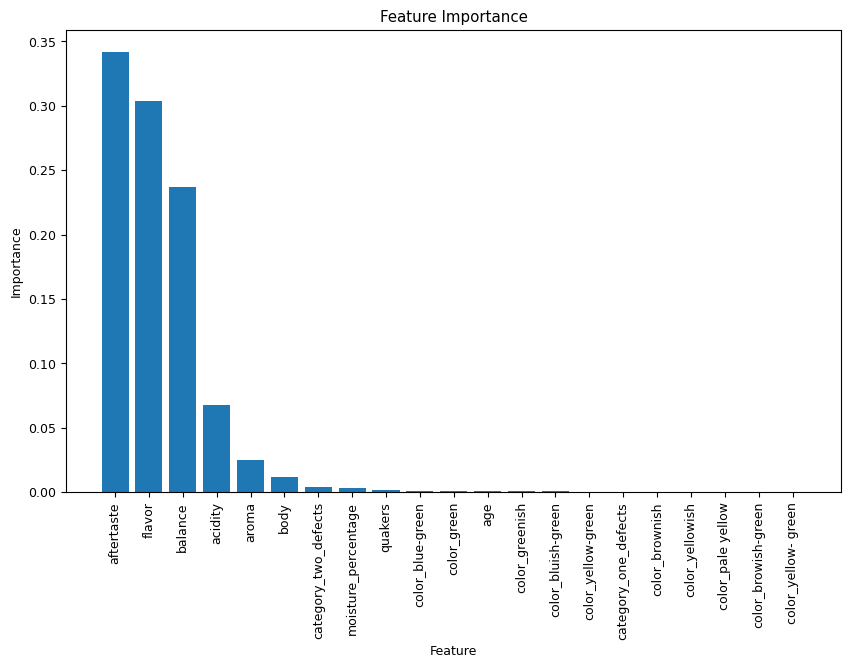

In [23]:
# Separate the input features (numeric and categorical variables) and the target variable
X = coffee_data_for_pred.drop(['total_cup_points'], axis=1)
y = coffee_data_for_pred['total_cup_points']

# Encode categorical variables
X_encoded = pd.get_dummies(X)

# Create a random forest regressor
rf = RandomForestRegressor(random_state=42)

# Fit the model
rf.fit(X_encoded, y)

# Get feature importances
importances = rf.feature_importances_

# Create a DataFrame to store the feature importances
importances_df = pd.DataFrame({'Feature': X_encoded.columns, 'Importance': importances})

# Sort the DataFrame by importance values in descending order
importances_df = importances_df.sort_values('Importance', ascending=False)

# Plot the feature importances
plt.figure(figsize=(10, 6))
plt.bar(importances_df['Feature'], importances_df['Importance'])
plt.xticks(rotation=90)
plt.xlabel('Feature')
plt.ylabel('Importance')
plt.title('Feature Importance')
plt.show()

**Key Insights:**

Based on our code analysis, 'aftertaste', 'flavor', and 'balance' are crucial for predicting total cup points. Many features with minimal importance can be excluded for model efficiency.

**2. Using Partial Dependence Plots:**

These plots show the effect of a single feature on predictions, with other variables constant. They help identify if a feature positively or negatively influences the target.



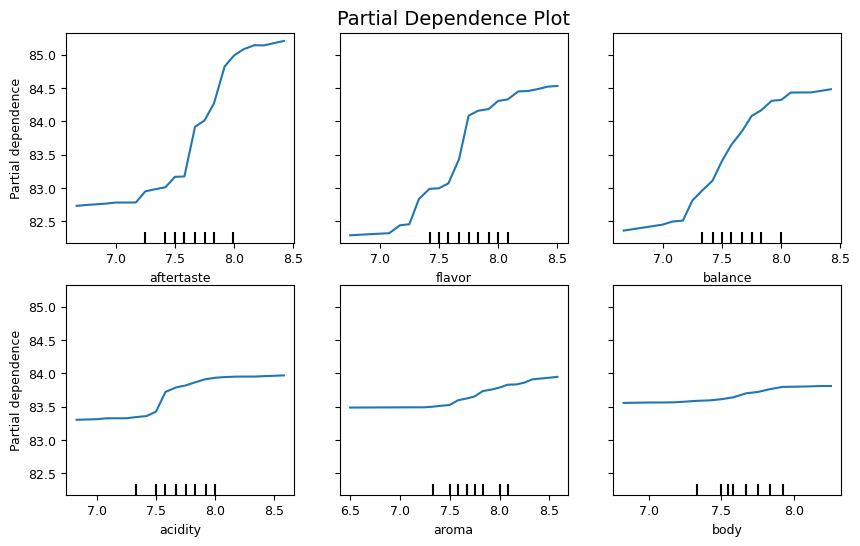

In [24]:
# selecting a small list of features to calculate partial dependence
features = ['aftertaste','flavor','balance','acidity','aroma','body']

# Plot the partial dependence
fig, ax = plt.subplots(figsize=(10, 6))
PartialDependenceDisplay.from_estimator(rf, X, features, target=0,ax=ax)

# Adjust the layout and spacing of the plot
ax.set_title('Partial Dependence Plot', fontsize=14)
ax.set_xlabel('Feature Values', fontsize=12)
ax.set_ylabel('Partial Dependence', fontsize=12)
ax.tick_params(axis='x', labelsize=10, rotation=45)  # Adjust the rotation and fontsize of the x-axis tick labels

**Key Takeaways:**
Total cup points are more influenced by 'aftertaste', 'flavor', and 'balance' than by 'acidity', 'aroma', and 'body'.

**3. Unpacking Permutation Feature Importance:**
This method gauges a feature's significance by shuffling its values and noting the model's performance change. A significant performance drop post-shuffling indicates high feature importance, and a slight drop suggests lower importance.



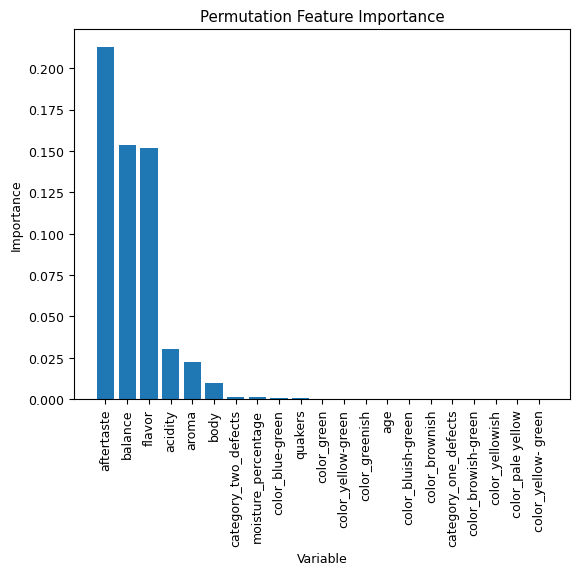

In [25]:
# Perform permutation feature importance
result = permutation_importance(rf, X_encoded, y, n_repeats=10, random_state=42)

# Get the feature importance scores
importance_scores = result.importances_mean

# Create a DataFrame to store the importance scores
importance_df = pd.DataFrame({'Variable': X_encoded.columns, 'Importance': importance_scores})

# Sort the DataFrame by importance scores in descending order
importance_df = importance_df.sort_values('Importance', ascending=False)

# Plot the feature importance scores as a bar graph
plt.bar(importance_df['Variable'], importance_df['Importance'])
plt.xticks(rotation=90)
plt.xlabel('Variable')
plt.ylabel('Importance')
plt.title('Permutation Feature Importance')

# Display the plot
plt.show()

**Key Insights:**

'Aftertaste', 'balance', and 'flavor' consistently emerge as the predominant contributors to total cup points.

# **Overview**
The analysis has led to several notable findings:

**Discoveries from the Data Exploration:**

* Taiwan accounted for over 30% of coffee grading.
* The most frequent varieties are Gesha and Cattura.
* The majority, over 60%, of coffee beans undergo the 'Washed / Wet' process.
* Green is the prevalent bean color. Without clarity on whether 'green' and 'greenish' are the same, they're treated as distinct.
* While Gesha and Caturra are widespread varieties, they also score the highest total cup points.
* Taiwan, being the dominant country of origin, yields coffee with commendable cup points.
* The 'Washed / Wet' method is popular, yet the double anaerobic washed process yields superior cup points, though its data sample is limited.
**Takeaways from Correlation Analysis:**

* Predictably, coffee quality scores strongly correlate with total cup points.
* A connection exists between Quakers and Category two defects, which aligns with the understanding that Quakers are defective beans.
* Other significant correlations within the data set are scarce.
**Insights from Model Analysis:**

* The primary influencers on total cup points are aftertaste, balance, and flavor.
* Contrarily, acidity, aroma, and body don't hold much predictive power for total cup points.
